In [1]:
%matplotlib inline
import matplotlib
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import glob
import os
import cv2

from google.colab.patches import cv2_imshow
from PIL import Image

from IPython.display import clear_output
from skimage.io import imread
from skimage.transform import resize
from skimage import io, transform, color, data_dir, draw, img_as_ubyte

In [2]:
from google.colab import drive
drive.mount('/content/drive')

Mounted at /content/drive


In [4]:
!ls drive/'My Drive'

 carseg_arrays2     'Colab Notebooks'   leaf-classification     submission.csv
 carseg_arrays_V3    data.pickle        plotting.py	        test.csv
 carseg_arrays.zip   data_utils.py     'Project of DL'	        train.csv
 carseg_data	     images	        sample_submission.csv   文档


In [5]:
array_path = 'drive/My Drive/carseg_arrays_V3/'

In [6]:
#version3
array_names3 = glob.glob(array_path + '*.npy')
array_names3.sort()
print(f"Number of arrays: {len(array_names3)}")
black_arrays3 = []
orange_arrays3 = []
photo_arrays3 = []

for array in array_names3:
    if 'black' in array:
        black_arrays3.append(np.load(array))
    if 'orange' in array:
        orange_arrays3.append(np.load(array))
    if 'photo' in array:
        photo_arrays3.append(np.load(array))

black_arrays3 = np.array(black_arrays3)
orange_arrays3 = np.array(orange_arrays3)
photo_arrays3 = np.array(photo_arrays3)


print(f"Number of black arrays: {len(black_arrays3)}")
print(black_arrays3.shape)
print(f"Number of orange arrays: {len(orange_arrays3)}")
print(orange_arrays3.shape)
print(f"Number of photo arrays: {len(photo_arrays3)}")
print(photo_arrays3.shape)
print(f"Total: {len(black_arrays3) + len(orange_arrays3) + len(photo_arrays3)}")

Number of arrays: 3003
Number of black arrays: 834
(834, 256, 256, 4)
Number of orange arrays: 2001
(2001, 256, 256, 4)
Number of photo arrays: 168
(168, 256, 256, 4)
Total: 3003


In [7]:
def label2colar(label_image):
    l2c_dict= {
        # 0 range hood
        0:(0,0,0),
        #"orange",       "hood",                 10
        10:(250,150,10),
        #"dark green",   "front door",           20
        20:(20,100,20),
        #"yellow",       "rear door",            30
        30:(250,250,10),
        #"cyan",         "frame",                40
        40:(10,250,250),
        #"purple",       "rear quater panel",    50
        50:(150,10,150),
        #"light green",  "trunk lid",            60
        60:(10,250,10),
        #"blue",         "fender",               70
        70:(20,20,250),
        #"pink",         "bumper",               80
        80:(250,10,250),
        #"no color",     "rest of car",          90
        90:(255,255,255),  ## white
    }
    color_image = np.zeros((label_image.shape[0], label_image.shape[1], 3), dtype=np.uint8)
    for label, color in l2c_dict.items():
            color_image[label_image == label] = color

    return color_image


def result2image(result_array):
    result_image = result_array[:,:,0:3]
    label_image = result_array[:,:,3]
    color_image = label2colar(label_image)
    mask = np.all(color_image != [0, 0, 0], axis=-1)
    result_image[mask] = color_image[mask]
    return result_image

# Augmentation

use the package imgaug

https://imgaug.readthedocs.io/en/latest/index.html

In [8]:
import imgaug.augmenters as iaa

In [10]:
images = photo_arrays3[:,:,:,0:3]
segmaps = photo_arrays3[:,:,:,-1,None]

# Flip

In [29]:
seq = iaa.Sequential([
    iaa.Fliplr(1)
])

images_aug, segmaps_aug = seq(images=images, segmentation_maps=segmaps)

In [30]:
print(images_aug.shape)
print(images_aug.dtype)
print(segmaps_aug.shape)
print(segmaps_aug.dtype)

(168, 256, 256, 3)
uint8
(168, 256, 256, 1)
uint8


In [31]:
filp_arr = np.concatenate((images_aug,segmaps_aug), axis = 3)
print(filp_arr.shape)

(168, 256, 256, 4)


**I think it would be better for us to save all datat in one .npy file. It would be easiry to upload to the GoogleDrive (taking less time) and more quickly for us to use. And we change change it to other file type easily.**

In [ ]:
#np.save("drive/My Drive/photo_filp.npy", arr)

Example transfer .npy to .png

In [32]:
#dest_dir = "drive/My Drive/savetest/"

In [35]:
'''
for i in range(2):  # number of images
        arr_to_img = filp_arr[i,:,:,0:3]
        plt.imsave(os.path.join(dest_dir, "photo_flip_{}.png".format(i)), arr_to_img, cmap='plasma')  The file name of first image would be photo_flip_0.png
        print('photo {} finished'.format(i))
'''

photo 0 finished
photo 1 finished


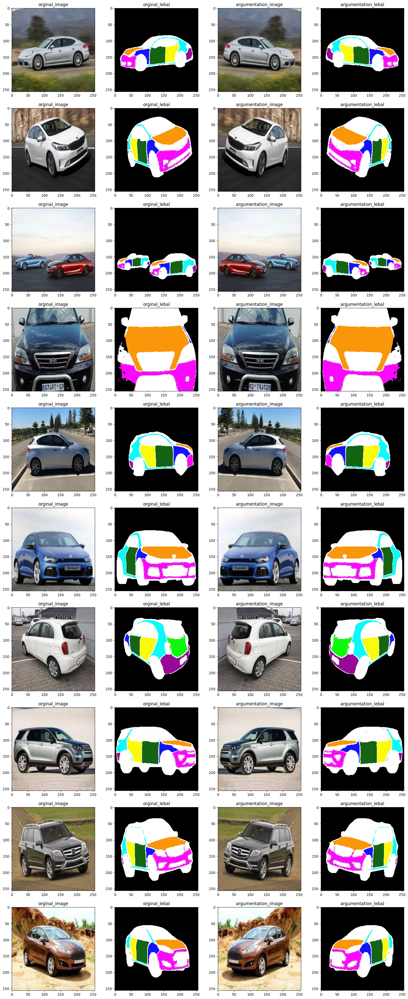

In [25]:
fig, ax = plt.subplots(10,4, figsize=(20,50))
for i in range(10):
    array1 = arr[i,:,:,-1]
    rgb_arr1 = label2colar(array1)
    array2 = photo_arrays3[i,:,:,-1]
    rgb_arr2 = label2colar(array2)
    ax[i,0].imshow(photo_arrays3[i,:,:,0:3])
    ax[i,0].set_title('orginal_image')
    ax[i,1].imshow(rgb_arr2)
    ax[i,1].set_title('orginal_lebal')
    ax[i,2].imshow(arr[i,:,:,0:3])
    ax[i,2].set_title('argumentation_image')
    ax[i,3].imshow(rgb_arr1)
    ax[i,3].set_title('argumentation_lebal')

plt.show()

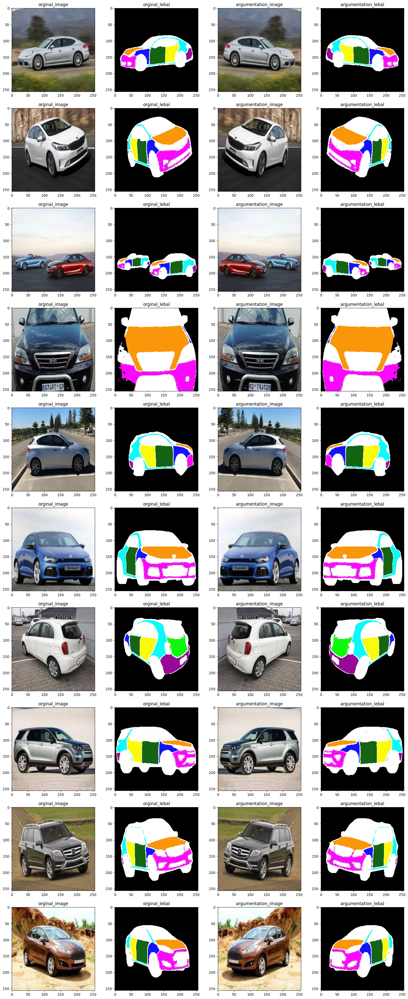

In [16]:
fig, ax = plt.subplots(10,4, figsize=(20,50))
for i in range(10):
    array1 = segmaps_aug[i,:,:,0]
    rgb_arr1 = label2colar(array1)
    array2 = photo_arrays3[i,:,:,-1]
    rgb_arr2 = label2colar(array2)
    ax[i,0].imshow(photo_arrays3[i,:,:,0:3])
    ax[i,0].set_title('orginal_image')
    ax[i,1].imshow(rgb_arr2)
    ax[i,1].set_title('orginal_lebal')
    ax[i,2].imshow(images_aug[i,:,:,:])
    ax[i,2].set_title('argumentation_image')
    ax[i,3].imshow(rgb_arr1)
    ax[i,3].set_title('argumentation_lebal')

plt.show()

# rotate

In [26]:
seq = iaa.Sequential([
    iaa.Affine(rotate=(-25, 25))
])

images_aug, segmaps_aug = seq(images=images, segmentation_maps=segmaps)

In [27]:
arr = np.concatenate((images_aug,segmaps_aug), axis = 3)
np.save("drive/My Drive/photo_rotate.npy", arr)

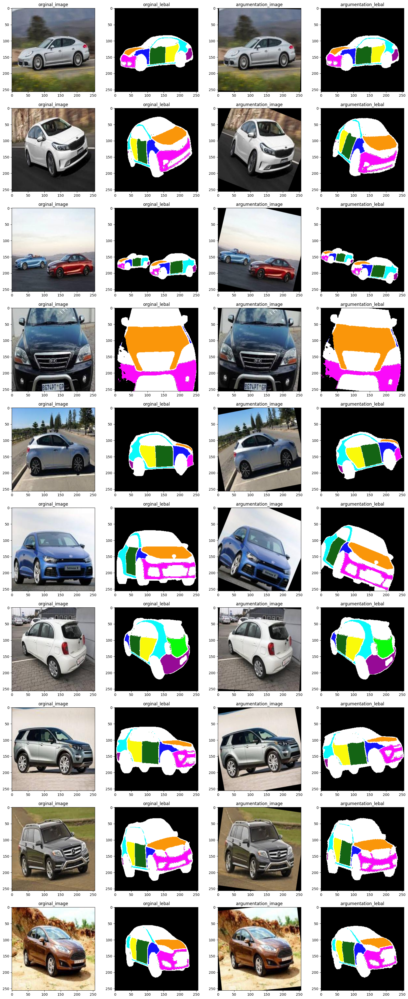

In [28]:
fig, ax = plt.subplots(10,4, figsize=(20,50))
for i in range(10):
    array1 = segmaps_aug[i,:,:,0]
    rgb_arr1 = label2colar(array1)
    array2 = photo_arrays3[i,:,:,-1]
    rgb_arr2 = label2colar(array2)
    ax[i,0].imshow(photo_arrays3[i,:,:,0:3])
    ax[i,0].set_title('orginal_image')
    ax[i,1].imshow(rgb_arr2)
    ax[i,1].set_title('orginal_lebal')
    ax[i,2].imshow(images_aug[i,:,:,:])
    ax[i,2].set_title('argumentation_image')
    ax[i,3].imshow(rgb_arr1)
    ax[i,3].set_title('argumentation_lebal')

plt.show()

#weather

# fog

In [19]:
seq = iaa.Sequential([
    iaa.Fog()
])

images_aug, segmaps_aug = seq(images=images, segmentation_maps=segmaps)

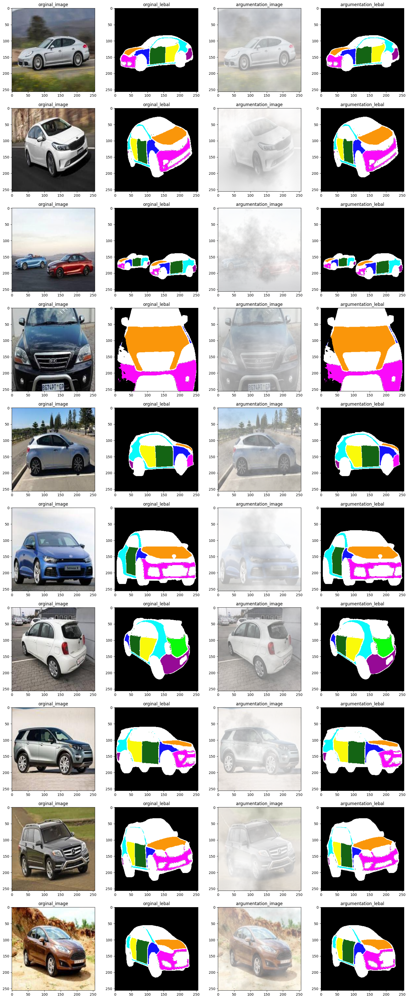

In [20]:
fig, ax = plt.subplots(10,4, figsize=(20,50))
for i in range(10):
    array1 = segmaps_aug[i,:,:,0]
    rgb_arr1 = label2colar(array1)
    array2 = photo_arrays3[i,:,:,-1]
    rgb_arr2 = label2colar(array2)
    ax[i,0].imshow(photo_arrays3[i,:,:,0:3])
    ax[i,0].set_title('orginal_image')
    ax[i,1].imshow(rgb_arr2)
    ax[i,1].set_title('orginal_lebal')
    ax[i,2].imshow(images_aug[i,:,:,:])
    ax[i,2].set_title('argumentation_image')
    ax[i,3].imshow(rgb_arr1)
    ax[i,3].set_title('argumentation_lebal')

plt.show()